# MammoAI: an app to identify early stage breast cancer

## Implementation

### 5.1 Importing libraries

In [1]:
%matplotlib inline

# Standard libraries
import os
import shutil
import pickle
from collections import Counter
import streamlit as st

# Data handling
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

# Image processing
import cv2
import opendatasets as od
from PIL import Image
from skimage import exposure
from skimage.filters import threshold_otsu
from skimage.morphology import disk
from skimage.restoration import wiener
import pywt

# Training Functions
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score
)

# Deep learning - TensorFlow 
import tensorflow as tf
from tensorflow import keras

from keras import backend as K
from keras import layers

from keras.layers import (
    Input,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
    BatchNormalization
)

from keras.callbacks import (
    Callback,
    EarlyStopping,
    ReduceLROnPlateau,
    LearningRateScheduler
)

from keras.models import (
    load_model, 
    Model
)

from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator,
    img_to_array,
    load_img
)

from keras.applications import InceptionV3, EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3
from keras.utils import to_categorical
from keras.losses import CategoricalCrossentropy
from keras.optimizers import Adam
from keras.regularizers import l1_l2, l2

### 5.2 Downloading dataset

We begin by downloading the dataset from kaggle. Note this code has been commented out to avoid users from downloading it multiple times as this process requires significant computational resources. 

{"username":"sashacasas","key":"22f6c628ee786c4c49feaa3b8ce806ba"}

In [6]:
#DDSM_dataset="https://www.kaggle.com/datasets/awsaf49/cbis-ddsm-breast-cancer-image-dataset"
#od.download(DDSM_dataset, data_dir="Dataset/CBIS_DDSM")

The downloaded dataset contained two folders: a jpeg folder containing all the images and a csv folder. As we can see below, the csv folder in turn contains 6 files: calc_case_description_test_set.csv, 
calc_case_description_train_set.cs, v
mass_case_description_test_set., sv
mass_case_description_train_set, dicom_info.csv, and meta.csv. The first four contain the details for each benign and malignant calcification case, whereas the df_dicom file contains the details for each image..csv

In [8]:
folder_path = "Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/csv" 

contents = os.listdir(folder_path)
print(len(contents))
print("Contents of folder:")
for item in contents:
    print(item)

6
Contents of folder:
calc_case_description_test_set.csv
calc_case_description_train_set.csv
dicom_info.csv
mass_case_description_test_set.csv
mass_case_description_train_set.csv
meta.csv


We begin by iterating through the df_dicom dataset and creating a dictionary where each key is the type of image (cropped images, full mammogram images, and ROIimage), obtained from the SeriesDescription column, and each value is another dictionary containing the image IDs as keys (obtained from the SeriesInstanceUID column) and the paths to the respective images as values (obtained from the image_path column). 

In [10]:
def build_nested_image_dict(df):
    image_dict = {}

    # Iterate through each row in the df_dicom csv
    for _, row in df.iterrows():
        #Obtain the image type, path, and ID respectively
        series_desc = row['SeriesDescription']
        image_path = row['image_path']
        value_final = row['SeriesInstanceUID']

        # Replace path prefix so it points to the dataset folder downloaded above
        new_path = image_path.replace(
            'CBIS-DDSM/',
            'Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/'
        )

        # If SeriesDescription is NaN, assume the image is all types (the right type can be later inferred when analysing the other 4 csvs). 
        if pd.isna(series_desc):
            for existing_desc in image_dict:
                # Make sure the path is not rewritten if an ID is repeated
                if value_final not in image_dict[existing_desc]:
                    image_dict[existing_desc][value_final] = new_path
        else:
            # Create dictionary if that image type has not been seen yet
            if series_desc not in image_dict:
                image_dict[series_desc] = {}
            # Add the image to the dictionary corresponding to that image's type. 
            image_dict[series_desc][value_final] = new_path

    return image_dict

In [11]:
df_dicom = pd.read_csv('Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/csv/dicom_info.csv')
df_dict = build_nested_image_dict(df_dicom)
df_dicom.head()

,file_path,image_path,AccessionNumber,BitsAllocated,BitsStored,BodyPartExamined,Columns,ContentDate,ContentTime,ConversionType,...,SecondaryCaptureDeviceManufacturerModelName,SeriesDescription,SeriesInstanceUID,SeriesNumber,SmallestImagePixelValue,SpecificCharacterSet,StudyDate,StudyID,StudyInstanceUID,StudyTime
0,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.12930...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.129308...,NaN,16,16,BREAST,351,20160426,131732.685,WSD,...,MATLAB,cropped images,1.3.6.1.4.1.9590.100.1.2.129308726812851964007...,1,23078,ISO_IR 100,20160720.0,DDSM,1.3.6.1.4.1.9590.100.1.2.271867287611061855725...,214951.0
1,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.24838...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.248386...,NaN,16,16,BREAST,3526,20160426,143829.101,WSD,...,MATLAB,full mammogram images,1.3.6.1.4.1.9590.100.1.2.248386742010678582309...,1,0,ISO_IR 100,20160720.0,DDSM,1.3.6.1.4.1.9590.100.1.2.161516517311681906612...,193426.0
2,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.26721...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.267213...,NaN,16,16,BREAST,1546,20160503,111956.298,WSD,...,MATLAB,full mammogram images,1.3.6.1.4.1.9590.100.1.2.267213171011171858918...,1,0,ISO_IR 100,20160807.0,DDSM,1.3.6.1.4.1.9590.100.1.2.291043622711253836701...,161814.0
3,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,NaN,16,16,BREAST,97,20160503,115347.770,WSD,...,MATLAB,cropped images,1.3.6.1.4.1.9590.100.1.2.381187369611524586537...,1,32298,ISO_IR 100,20170829.0,DDSM,1.3.6.1.4.1.9590.100.1.2.335006093711888937440...,180109.0
4,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,NaN,8,8,Left Breast,3104,20160503,115347.770,WSD,...,MATLAB,NaN,1.3.6.1.4.1.9590.100.1.2.381187369611524586537...,1,0,ISO_IR 100,NaN,DDSM,1.3.6.1.4.1.9590.100.1.2.335006093711888937440...,NaN


The reason why the paths had to be extracted from df_dicom is that many of the paths on the other 4 csvs are broken/do not point to the correct images. Now that the correct paths have been obtained, we can replace the paths for each of the 4 datasets with those obtained above and combine all 4 csvs into a single one.  Note since the IDs of images above were stored in with NaN SeriesDescription were stored in the dictionaries for all SeriesDescription values, their ID will always be found in exactly one of the folders when iterating through the merged dataframe at this stage. 

In [13]:
def combine_datasets(mass_dataset, calc_dataset, df_dict):
    # Rename some of the labels in the masses and calcificationa datasets so the datasets can be combined. 
    mass_dataset = mass_dataset.rename(columns={
        'mass shape': 'type',
        'mass margins': 'margin|distribution'
    })
    calc_dataset = calc_dataset.rename(columns={
        'calc type': 'type',
        'calc distribution': 'margin|distribution',
        'breast density': 'breast_density'
    })

    # Combine the inputted mass and calcification datasetts
    merged_df = pd.concat([mass_dataset, calc_dataset], ignore_index=True)

    #Replace the BENIGN_WITHOUT_CALLBACK column with benign to simplify the classification problem. 
    #The difference between these two column is that, whilst both point to benign cases, benign without callback ones didnt require a second verification. 
    merged_df['pathology'] = merged_df['pathology'].replace('BENIGN_WITHOUT_CALLBACK', 'BENIGN')

    #Create the label that will be used for classification by merging whether a case is benign/malignant and whether it is a mass/calcification
    merged_df['label'] = merged_df['abnormality type'] + ' ' + merged_df['pathology']

    #This mapping is used so the categories in the pathology column of the dataset and the keys of the dictionary created from the df_dicom dataset can be matched.
    mapping = {
        'cropped image file path': 'cropped images',
        'image file path': 'full mammogram images',
        'ROI mask file path': 'ROI mask images'
    }

    #Iterate through each type of image and each image in the dataset. 
    for col, mapping_value in mapping.items():
        for i, path in enumerate(merged_df[col]):
            try:
                #Get the ID for the image 
                folder_key = path.split('/')[2]
                #Find the correct path in the df_dicom dataset using the ID
                image_path = df_dict[mapping_value][folder_key]
                
                #Replace path in the dataframe
                merged_df.at[i, col] = image_path

            except (KeyError, IndexError, FileNotFoundError, OSError):
                merged_df.at[i, col] = None

    return merged_df

In [14]:
# Open the 4 csvs containing the training and testing cases for masses and calcifications

df_mass_train = pd.read_csv('Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/csv/mass_case_description_train_set.csv')
df_calc_train = pd.read_csv('Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/csv/calc_case_description_train_set.csv')

df_mass_test = pd.read_csv('Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/csv/mass_case_description_test_set.csv')
df_calc_test = pd.read_csv('Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/csv/calc_case_description_test_set.csv')

#Merge all 4 datasets
df_train = combine_datasets(df_mass_train, df_calc_train, df_dict)
df_test = combine_datasets(df_mass_test, df_calc_test, df_dict)
combined_df = pd.concat([df_train, df_test], ignore_index=True)

combined_df.head()

,patient_id,breast_density,left or right breast,image view,abnormality id,abnormality type,type,margin|distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path,label
0,P_00001,3,LEFT,CC,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,mass MALIGNANT
1,P_00001,3,LEFT,MLO,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,mass MALIGNANT
2,P_00004,3,LEFT,CC,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,mass BENIGN
3,P_00004,3,LEFT,MLO,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,mass BENIGN
4,P_00004,3,RIGHT,MLO,1,mass,OVAL,CIRCUMSCRIBED,4,BENIGN,5,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-imag...,mass BENIGN


We now carry out a small dataset analysis to see how many images there are for each category, how many are missing, and how many are duplicated. We can see there are 465 duplicated full images due to some full images containing more than one mass/calcification case. We can also observe there were 3 ROI and 2 full images missing. 

In [16]:
image_types = ['ROI mask file path', 'cropped image file path', 'image file path']
labels = ["ROI images", "Cropped images", "Full images"]

#Iterate through each image type
for image_type, label in zip(image_types, labels):
    # If an image was missing, its path was set to NaN. Therefore, we can sum all NaN values in that column to see how many are missing
    print(label+" missing: "+str(combined_df[image_type].isna().sum()))
    
    # Conversely, we get the number of images found by summing up values which are not NaN
    print(label+": "+str(combined_df[image_type].notna().sum()))
    
    # To find duplicate instances, count the number of times a path appears and sum the number of them with a count greater that 1. 
    combined_clean = pd.concat([combined_df[image_type]], axis=0).dropna()
    value_counts = combined_clean.value_counts()
    total_duplicate_instances = (value_counts[value_counts > 1] - 1).sum()
    print("Total "+label+ " duplicate instances (excluding NaN):"+ str(total_duplicate_instances))
    
    print("\n" )

#Display total number of images
folder_path = "Dataset/CBIS_DDSM/cbis-ddsm-breast-cancer-image-dataset/jpeg/" 
file_count = sum(len(files) for _, _, files in os.walk(folder_path))
print(f"Total files: {file_count}")

ROI images missing: 3
ROI images: 3565
Total ROI images duplicate instances (excluding NaN):0


Cropped images missing: 2
Cropped images: 3566
Total Cropped images duplicate instances (excluding NaN):0


Full images missing: 0
Full images: 3568
Total Full images duplicate instances (excluding NaN):465


Total files: 10237


### 5.2 Dataset Analysis

To analyse this dataset, we begin by looking at the number of cases corresponding to each pathology, breast density, breast side, image view, assesment and subtlety. 

In [19]:
def plot_abnormality_value_counts(df, column_name):
    #Get the unique abnormality types (mass/calcification)
    abnormality_types = df['abnormality type'].unique()

    #Ensure the plot has two columns (for each plotted column, one for mass and one for calcification)
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

    # For the specified column in the mass and calcification column:
    for ax, abnormality in zip(axes, abnormality_types):
        #Count the number of cases that have a specific value in the inputted column
        subset = df[df['abnormality type'] == abnormality]
        value_counts = subset[column_name].value_counts().sort_index()

        #Plot a bar chart where the x-axis contain each unique value for the specified column and where the y-axis are the number of cases for that unique value. 
        value_counts.plot(kind='bar', ax=ax)
        ax.set_title(f'{column_name} for {abnormality}')
        ax.set_xlabel(column_name)
        ax.set_ylabel('Count')
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

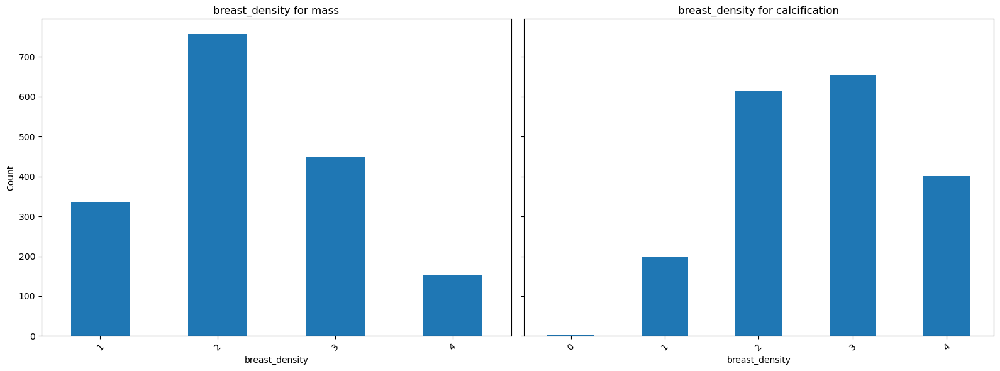

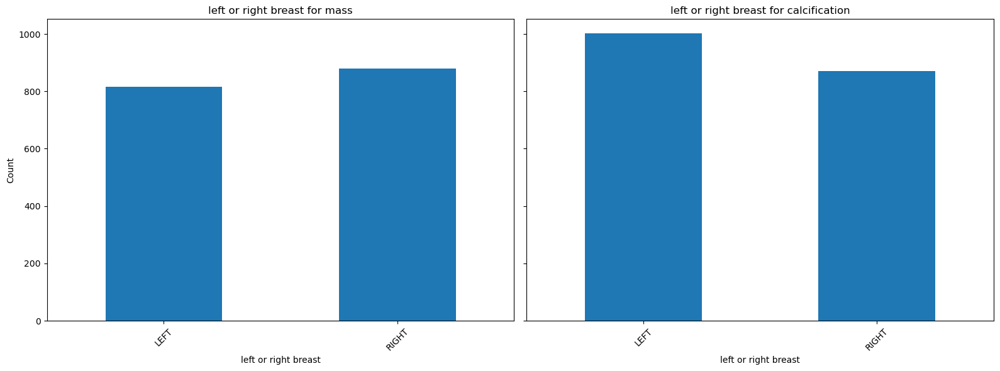

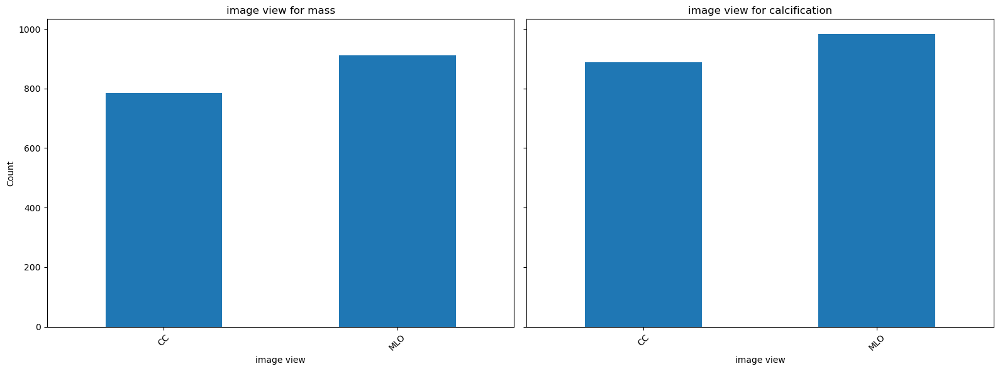

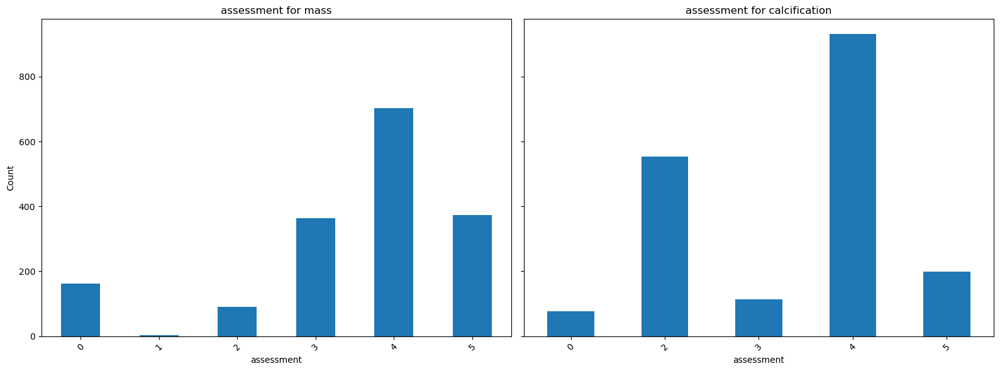

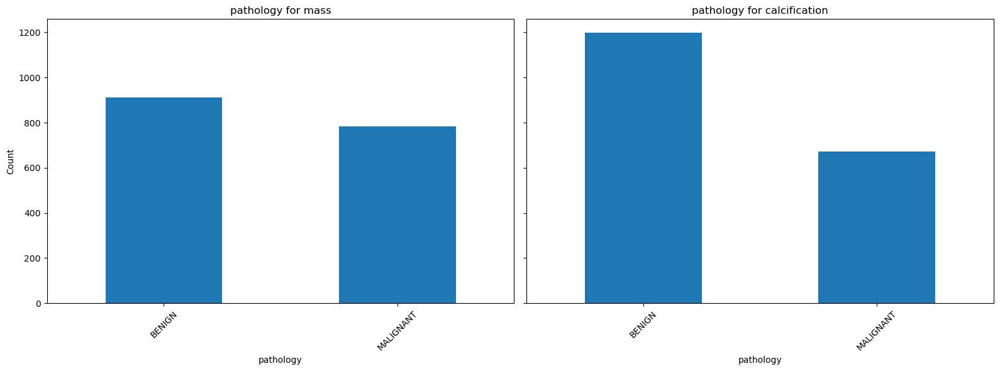

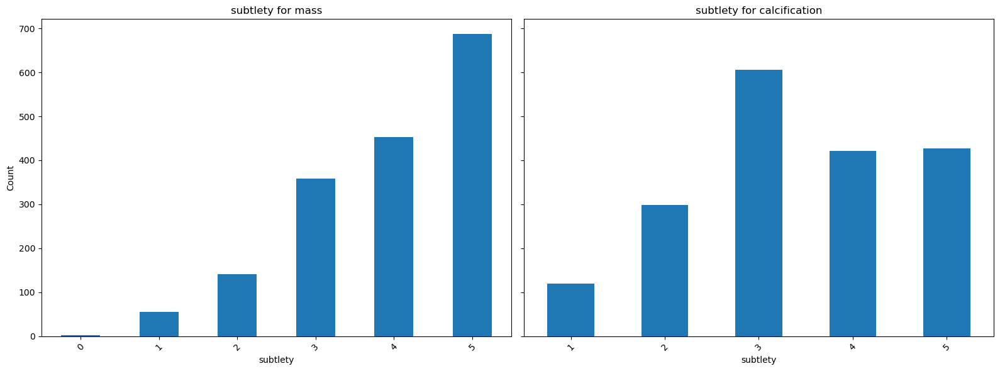

In [20]:
columns = ["breast_density", "left or right breast", "image view", "assessment", "pathology", "subtlety"]
for column in  columns:
    plot_abnormality_value_counts(combined_df, column)

The abnormality and margin|distribution have too many unique values for a bar chart to be a good visualization. Instead, we have decided to create a table where each row corresponds to a unique value for this column and the table's columns contain the number of maass and calcification cases for that unique value.  

In [22]:
def generate_abnormality_table(df, column_name):
    # The code below groups the dataframe based on the inputted column and the 'abnormality type' column,  counts how many rows fall into each group, and finally unstacks it so the values are split into columns.
    table = (df.groupby([column_name, 'abnormality type']).size().unstack(fill_value=0))
    return table

In [23]:
table_columns = ["type", "margin|distribution"]
for column in table_columns:
    table = generate_abnormality_table(combined_df, column)
    print("Table "+column)
    print("\n" * 1)
    print(table.to_string())
    print("\n" * 3)

Table type


abnormality type                                          calcification  mass
type                                                                         
AMORPHOUS                                                           181     0
AMORPHOUS-PLEOMORPHIC                                                16     0
AMORPHOUS-ROUND_AND_REGULAR                                           3     0
ARCHITECTURAL_DISTORTION                                              0   103
ASYMMETRIC_BREAST_TISSUE                                              0    25
COARSE                                                               39     0
COARSE-LUCENT_CENTER                                                  6     0
COARSE-PLEOMORPHIC                                                    4     0
COARSE-ROUND_AND_REGULAR                                              4     0
COARSE-ROUND_AND_REGULAR-LUCENT_CENTER                               10     0
COARSE-ROUND_AND_REGULAR-LUCENT_CENTERED           

### 5.3 Extracting Images

We now define the function to process the dataset images. One of the main additions at this point is the application of Contrast Limited Adaptive Histogram Equalization algorithm (CLAHE), an algorithm which enhances local contrast, particularly in images with very dark or bright regions, by dividing the image into blocks, computing their histogranm of brightness, clipping and equalizing each histogram using bilinear interpolation between the blocks, and merging the blocks together again. This method has shown to be particularly useful when applied to greyscale medical images (https://link.springer.com/article/10.1007/s11042-024-19070-6) which is why it has been decided to use it in this project. The code to apply this method has been obtained from https://medium.com/imagecraft/histogram-equalization-clahe-algorithm-8841d402fc76. Other preprocessing steps involves resizing the image to 224 by 224 and normalizing them by dividing their pixel values by the maximum intensity of 255.

In [26]:
def process_image(image_path, target_size):
    absolute_image_path = os.path.abspath(image_path)
    image = cv2.imread(absolute_image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #Resize the images to 255 by 255
    image = cv2.resize(image, (target_size[1], target_size[0]))

    #Convert the RGB images to LAB, where L is the lightness, and A and B are the color channels.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l_channel, a_channel, b_channel = cv2.split(image)
    #Apply CLAHE to the image
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    l_channel = clahe.apply(l_channel)
    #Merge the blocks back together and turn the image back to RGB
    image = cv2.merge((l_channel, a_channel, b_channel))
    image = cv2.cvtColor(image, cv2.COLOR_LAB2RGB)

    #Normalize the image
    image = 255 - image
    image = image.astype(np.float32) / 255.0
    
    return image

In [27]:
target_size = (224, 224, 3)

#Ensure the 'cropped image file path' has no NaN values
full_mass_sample = combined_df.dropna(subset=['cropped image file path'], inplace=False)

#Get all the images for each case from the jpeg folder
dataset_images = []
for image in full_mass_sample['cropped image file path'].tolist():
    dataset_images.append(process_image(image, target_size))

#Turn the label column into numerical format for classification
class_mapper = {'calcification BENIGN': 0, 'calcification MALIGNANT': 1, 'mass BENIGN': 2, 'mass MALIGNANT': 3}
dataset_indices = full_mass_sample['label'].replace(class_mapper).infer_objects(copy=False)
dataset_labels = to_categorical(dataset_indices, num_classes=len(class_mapper))

num_classes = len(class_mapper)
class_names = list(class_mapper.keys())

C:\Users\casas\AppData\Local\Temp\ipykernel_11088\725112500.py:13: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  dataset_indices = full_mass_sample['label'].replace(class_mapper).infer_objects(copy=False)


To ensure the images are loaded correctly, we will count the number of images extracted for each category and plot the full, cropped, and ROI image for a mass and a calcification case. We can see 3566 images have been laoded, which is the total number of cropped image paths counted before. We can also see tha images below correspond to thoseone would expect for a full, cropped, and ROI image respectively. 

In [36]:
# Count the number of images for each classification category
label_counts = Counter(dataset_indices)
for label, count in label_counts.items():
    print(f"{class_names[label]}: {count}")

mass MALIGNANT: 784
mass BENIGN: 912
calcification MALIGNANT: 672
calcification BENIGN: 1198


Type: mass


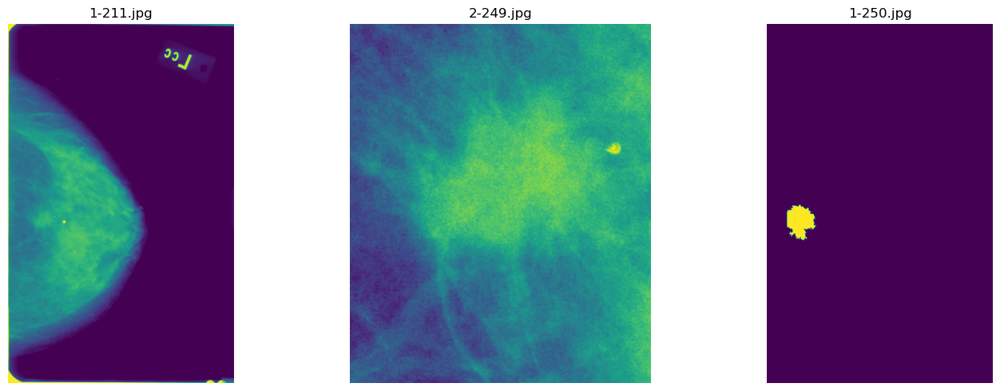

Type: calcification


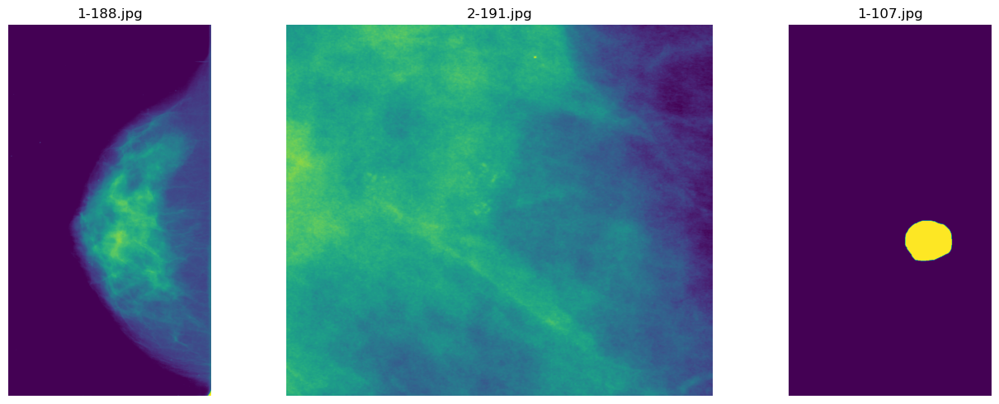

In [37]:
types = ["mass", "calcification"]
for type in types:
    print("Type: "+type)
    
    #Find the first index that has mass/calcification as its abnormality type
    index = combined_df[combined_df['abnormality type'] == type].index[0]

    #Obtain the paths for all 3 images (full, cropped, ROI) corresponding to that index
    image_paths = [
        combined_df.loc[index, 'image file path'],
        combined_df.loc[index, 'cropped image file path'],
        combined_df.loc[index, 'ROI mask file path']
    ]
    
    # Create a subplot with 1 row and 3 columns (full, cropped, and ROI image)
    fig, axes = plt.subplots(1, len(image_paths), figsize=(15, 5)) 
    
    # Loop through image paths and plot them
    for ax, path in zip(axes, image_paths):
        img = Image.open(path)
        ax.imshow(img)
        ax.set_title(path.split('/')[-1]) 
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

### 5.4 Model Evaluation and support functions

We create a function that takes as inpus the model, test_images, and labels, and class names for each Kfold and combines them to find the average metrics for each class. 

In [42]:
def evaluate_model(models, test_images_list, test_labels_list, class_names):
    all_preds = []
    all_labels = []

    # Find the predicted and real labels for each image and for each model (results in arrays of length n*num_test_images, where n is the number of folds)
    for model, test_images, test_labels in zip(models, test_images_list, test_labels_list):
        preds = model.predict(test_images)
        all_preds.extend(np.argmax(preds, axis=1))  
        all_labels.extend(np.argmax(test_labels, axis=1))  
    
    #Turn the lists above into numpy arrays
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    # Create a classification report and use it to obtain the precision, recall, and F1 for ecah class.
    report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)
    metrics_df = pd.DataFrame(report).transpose()
    per_class_df = metrics_df.loc[class_names, ["precision", "recall", "f1-score"]]
    final_table = per_class_df.T
    
    #Using the classification report we can also obtain the average precision, recall and F1 for all classes.
    macro_avg = report["macro avg"]
    final_table["Total (Macro Avg)"] = {
        "precision": macro_avg["precision"],
        "recall": macro_avg["recall"],
        "f1-score": macro_avg["f1-score"]
    }

    #To improve readability, multiply each metric by 100 and round to the nearest decimal place.
    final_table = final_table * 100
    final_table = final_table.round(1).astype(str) + '%'

    # Also generate the confusion matrix (again note the number of images will be n times greater where n is the number of folds). 
    cm = confusion_matrix(all_labels, all_preds)

    return final_table, cm

We also create a function that takes the confusion matrix generated by evaluate_model as input and plots it.

In [45]:
def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

Lastly we define an exponential function that halfs the learning rate from its initial value of 1e-4 every 10 epochs until it reaches a minimum of 5e-6 (exponential decay)

In [50]:
def lr_schedule(epoch, initial_lr=1e-4, decay_base=0.5, halving_interval=10, min_lr=5e-6):
    lr = initial_lr * decay_base ** (epoch / halving_interval)
    lr = max(lr, min_lr)  
    return lr

In [51]:
def lr_schedule(epoch): 
    lr = 0.0001 
    if epoch > 10: 
        lr *= 0.1 
    elif epoch > 5: 
        lr *= 0.5 
    return lr

### 5.5 GradCam

Below is the code used for the GradCam implementation which will highlight the areas of the images that influenced the most the predictions of the models that will be developed below. This algorithm first takes the last convolutional layer within the model (the one with the most complex features) using the get_last_layer function, then it creates a model that takes as input the image pixels and outputs the feature map of this last layer and original output of the main model, and finally uses this temporary model to compute how much each location in the convolutional feature maps ontributed to the target class (gradients), with the target class being the one that achieved the highest score (i.e. the predicted category by the model). The gradients are then averaged so that instead of having one gradient for every pixel (too detailed), we have the gradient over the whole spatial map for each channel (each neuron in the last layer), and these gradients are used to create a 2D heatmap. 

In [53]:
def get_last_layer(model):
    #Iterate through the model layers starting from the last one
    for layer in reversed(model.layers):
        #Return the first convolutional layer encountered (i.e. the last convolutional layer in the model)
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name

In [54]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    #Create the model that uses the image pixels to output the original model's classes and the feature maps of the last convolutional layer
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    
    #Use GradientTape to record the gradients of the operations below
    with tf.GradientTape() as tape:
        #Use the temporrary model defined above to calculate the feature maps and model classes
        conv_outputs, predictions = grad_model(img_array)
        #Define the target class as the one with the highest score
        pred_index = tf.argmax(predictions[0])
        #Get the socre for the target class
        class_channel = predictions[:, pred_index]

    #Compute the gradients of the top class' score vs the convolutional feature maps
    grads = tape.gradient(class_channel, conv_outputs)
    #Average the gradients for each feature map
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    #Compute and return a 2D heatmap that represents the gradients calculated above
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap + 1e-8)
    return heatmap.numpy()

With the heatmap created, we only now need to superimpose it over the original image so the user sees the areas that affected the prediction the most (i.e. which feature maps correspond with which areas of the image), and to plot the GradCam image as well as the original image and its ROI. 

In [55]:
def apply_gradcam(image, heatmap, alpha=0.4):
    #Scale the heatmap pixels to 0-255 from 0-1 and resize it to have the same size as the original image
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    
    #Convert the current heatmap from greyscale into a colored one using the jet colour map
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    if image.shape[-1] == 1:
        image = np.repeat(image, 3, axis=-1)  
        
    #Blend the heatmap with the original image
    superimposed_img = heatmap_color * alpha + image
    superimposed_img = np.uint8(superimposed_img)
    return superimposed_img

In [56]:
def show_gradcam(image, model, ROI_img, class_names=None):

    #Obtain the image with the GradCam heatmap superimposed
    input_tensor = np.expand_dims(image, axis=0).astype(np.float32)
    last_conv_layer_name = get_last_layer(model)
    heatmap = make_gradcam_heatmap(input_tensor, model, last_conv_layer_name)
    overlay = apply_gradcam((image * 255).astype("uint8"), heatmap)

    #Create the plots for the 3 images to be plotted
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  

    #Show the original image
    axes[0].imshow(image[..., 0].squeeze())
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    #Show the GradCam heatmap
    axes[1].imshow(overlay[..., 0], cmap='jet')
    axes[1].set_title("Grad-CAM Heatmap")
    axes[1].axis('off')

    #Show the image ROI
    axes[2].imshow(ROI_img[..., 0])
    axes[2].set_title("ROI")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

### 5.5 Models Training and Evaluation

#### 5.5.1 Model 1

We begin by using keras to define the first model which contains 3 convolutional layers, 2 pooling ones, a and a flatten and a dense one so the outputs from the colutional layers can be used to decide which category the image belongs to. Softmax activation is used in the last layer so the final neurons' outputs correspond to the likelihood of the image belonging to that category. 

In [46]:
def create_model_1(learning_rate):
    inputs = keras.Input(shape=(224, 224, 3))

    #Block 1
    x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(inputs)
    x = layers.MaxPooling2D(pool_size=2)(x)

    #Block 2
    x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

    #Block 3
    x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
    x = layers.Flatten()(x)

    #Classification layer
    outputs = layers.Dense(4, activation="softmax")(x)

    #Model
    model = keras.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate),
                  loss="categorical_crossentropy",
                  metrics=['accuracy']
    )
   
    return model

We now define a function that can either train a certain model or load it from the saved models. It takes as inputs the function used to define the model (create_model_1 above), the images and labels within the dataset, the number of kfold split to use, and the path to the folder where models should be saved. It outputs the models trained/loaded, the testing images and labels for each split, and the indices in the combined_df dataset the images in each fold. The advantage of this function is that it can be reused in future iterations when the model is changed. 

In [46]:
def run_kfold_models(dataset_images, dataset_labels, num_classes, model_fn, 
                     splits=3, model_dir='kfold_results/model_1', mode='train'):
    
    os.makedirs(model_dir, exist_ok=True)

    test_images_arr, test_labels_arr, train_images, train_labels, models, fold_indices  = [], [], [], [], [], []

    #Define some of the training parameters
    batch_size = 32
    max_epochs = 50
    initial_learning_rate = 0.0001

    #Split the training and testing images into n folds
    kf = KFold(n_splits=splits, shuffle=True, random_state=42)
    dataset_images = np.array(dataset_images) 

    if mode == 'train':
        fold = 0
        #We begin by getting the training and testing images for each fold
        for train_index, val_index in kf.split(dataset_images):
            X_train, X_val = dataset_images[train_index], dataset_images[val_index]
            y_train, y_val = dataset_labels[train_index], dataset_labels[val_index]

            #Save the testing images and labels into their respecive arrays (needed for the evaluation function)
            test_images_arr.append(X_val)
            test_labels_arr.append(y_val)
            train_images.append(X_train)
            train_labels.append(y_train)
            fold_indices.append(val_index)

            #Define the model and the early stopping mechanism. The latter is used to stop training if the validation loss stops decreasing (reduces training time).
            model = model_fn(initial_learning_rate)
            early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
            
            # Fit the model with the images and labels for the current split
            history = model.fit(X_train, y_train,
                                batch_size=batch_size,
                                epochs=max_epochs,
                                validation_data=(X_val, y_val), 
                                callbacks=[LearningRateScheduler(lr_schedule), early_stopping])

            #Save the model
            model_path = os.path.join(model_dir, f'my_cnn_model_{fold}.h5')
            model.save(model_path)
            models.append(model)
            fold += 1

    elif mode == 'load':
        #Load the model saved for each fold
        for fold in range(splits):
            model_path = os.path.join(model_dir, f'my_cnn_model_{fold}.h5')
            model = load_model(model_path)
            models.append(model)

        #Get the indices of the validation images and labels for each fold (this is important so the validation images for each fold are those the model didnt see during training)
        for train_index, val_index in kf.split(dataset_images):
            X_train, X_val = dataset_images[train_index], dataset_images[val_index]
            y_train, y_val = dataset_labels[train_index], dataset_labels[val_index]

            test_images_arr.append(X_val)
            test_labels_arr.append(y_val)
            train_images.append(X_train)
            train_labels.append(y_train)
            fold_indices.append(val_index)

    return models, test_images_arr, test_labels_arr, fold_indices, train_images, train_labels

We can now use the run_kfold_models and the evaluation functions to obtain the results for this iteration.

In [48]:
# Training mode
#models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models(
#    dataset_images, dataset_labels,
#    num_classes=num_classes,
#    model_fn=create_model_1,
#    model_dir='kfold_results/model_1.1',
#    mode='train'
#)

# Loading mode
models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models(
    dataset_images, dataset_labels,
    num_classes=num_classes,
    model_dir='kfold_results/model_1',
    model_fn=create_model_1, 
    mode='load'
)

#### Training dataset results

75/75 ━━━━━━━━━━━━━━━━━━━━ 31s 400ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 35s 458ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 34s 433ms/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,67.8%,77.9%,79.2%,65.7%,72.6%
recall,89.4%,32.3%,63.5%,81.6%,66.7%
f1-score,77.1%,45.7%,70.5%,72.8%,66.5%


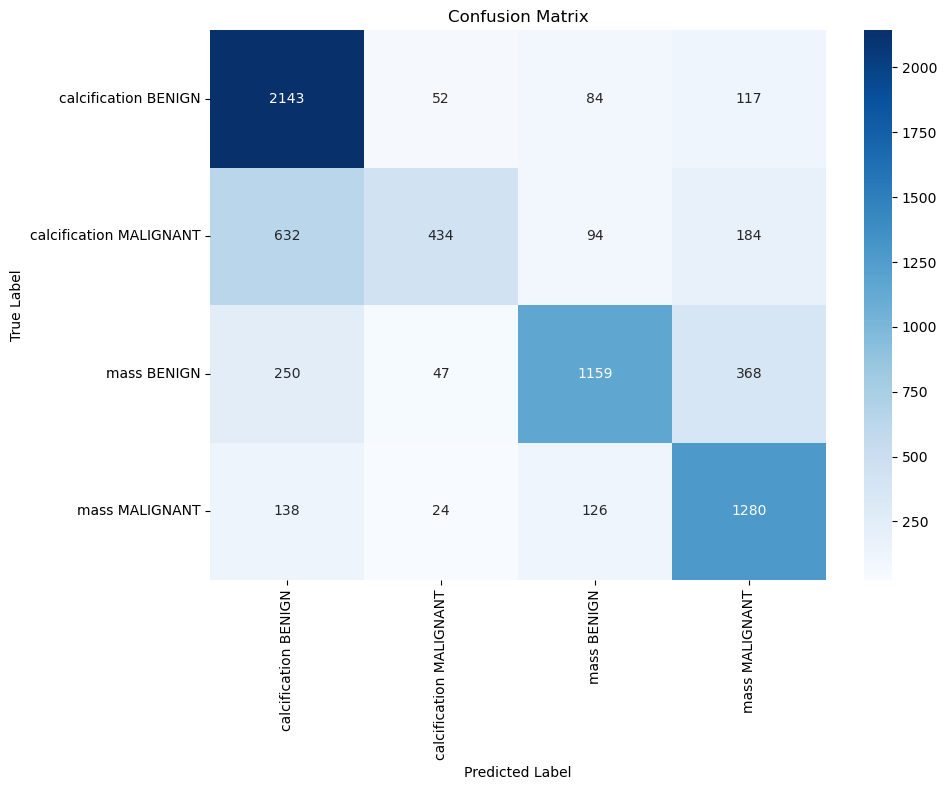

In [49]:
final_table, cm = evaluate_model(models, train_images, train_labels, class_names)
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

#### Testing dataset results

38/38 ━━━━━━━━━━━━━━━━━━━━ 14s 361ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 15s 385ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 15s 387ms/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,58.4%,37.2%,48.2%,43.8%,46.9%
recall,82.1%,10.6%,35.3%,57.1%,46.3%
f1-score,68.3%,16.5%,40.8%,49.6%,43.8%


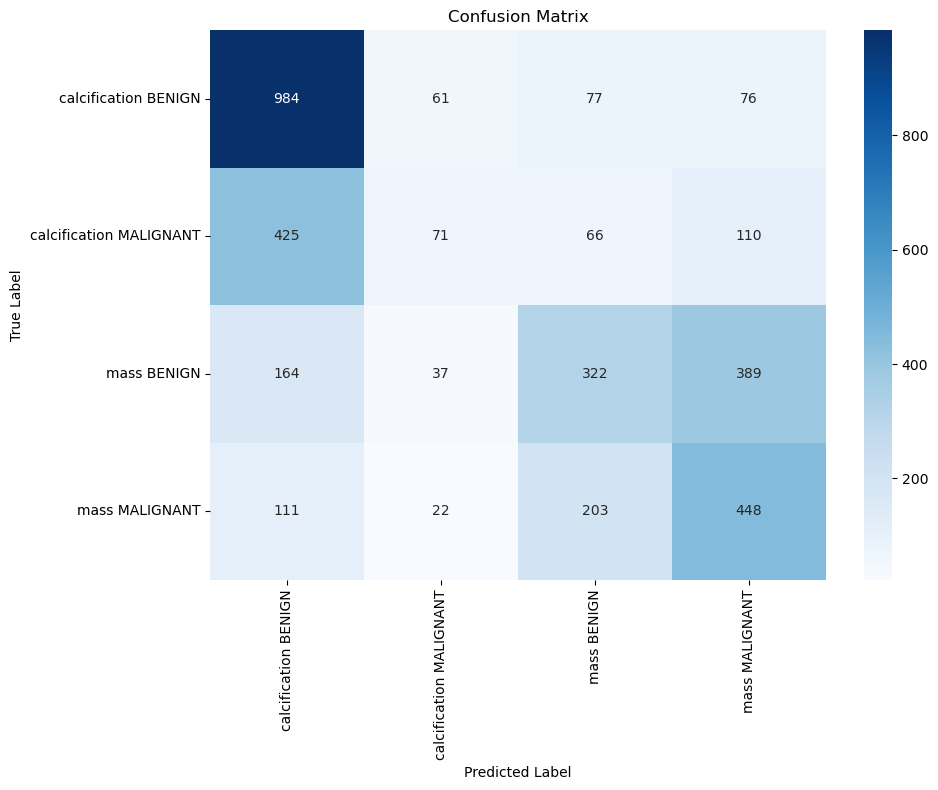

In [50]:
final_table, cm = evaluate_model(models, test_images, test_labels, class_names)
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

In [ ]:
del models, test_images, test_labels, fold_indices, train_images, train_labels

#### 5.5.2 Model 2

We begin by using keras to define the second model which contains 4 blocks comprised of a convolutional, a BatchNormalization, and a Pooling layer, and two dense layers so the outputs from the colutional layers can be used to decide which category the image belongs to. Softmax activation is used in the last layer so the final neurons' outputs correspond to the likelihood of the image belonging to that category. 

In [66]:
def create_model_2(initial_learning_rate):
    inputs = keras.Input(shape=(224, 224, 3))

    #Block 1
    x = layers.Conv2D(32, 3, padding='same', activation='relu')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2)(x)

    #Block 2
    x = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2)(x)

    #Block 3
    x = layers.Conv2D(128, 3, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2)(x)

    #Block 4
    x = layers.Conv2D(256, 3, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2)(x)

    #Classification layers
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(4, activation='softmax')(x)

    #Model 
    model = keras.Model(inputs=inputs, outputs=outputs)
    model.compile(
        optimizer=keras.optimizers.Adam(initial_learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

The run_kfold_models_aug function below is similar to run_kfold_models above, but it also employs an ImageDataGenerator to apply a series of data augmentations to the training dataset. Due to the lack of resources, fine tuning the data augemntations applied was not feasible, so instead a standard set of augmentations was applied. This standard set was in turn obtained from https://www.codesofinterest.com/2018/02/using-data-augmentations-in-keras.html

In [60]:
def run_kfold_models_aug(dataset_images, dataset_labels, num_classes, model_fn, 
                     splits=3, model_dir='kfold_results/model_2', mode='train', max_epochs=50):
    os.makedirs(model_dir, exist_ok=True)

    test_images_arr, test_labels_arr, train_images, train_labels, models, fold_indices  = [], [], [], [], [], []

    #Define some of the training parameters
    batch_size = 32
    initial_learning_rate = 0.0001

    #Split the training and testing images into n folds
    kf = KFold(n_splits=splits, shuffle=True, random_state=42)
    dataset_images = np.array(dataset_images)  # Features

    if mode == 'train':
        fold = 0
        #We begin by getting the training and testing images for each fold
        for train_index, val_index in kf.split(dataset_images):
            X_train, X_val = dataset_images[train_index], dataset_images[val_index]
            y_train, y_val = dataset_labels[train_index], dataset_labels[val_index]

            #Save the testing images and labels into their respecive arrays (needed for the evaluation function)
            test_images_arr.append(X_val)
            test_labels_arr.append(y_val)
            train_images.append(X_train)
            train_labels.append(y_train)
            fold_indices.append(val_index)

            #Define the data augmentations
            datagen = ImageDataGenerator(
                rotation_range=30,
                width_shift_range=0.2,
                height_shift_range=0.2,
                shear_range=0.2,
                zoom_range=0.2,
                horizontal_flip=True,
                fill_mode='nearest'
            )

            #Apply the data augmentations to the training dataset
            datagen.fit(X_train)
            augmented_data_generator = datagen.flow(X_train, y_train, batch_size=batch_size)

            #Define the model and the early stopping mechanism. The latter is used to stop training if the validation loss stops decreasing (reduces training time).
            model = model_fn(initial_learning_rate)
            early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

            # Fit the model with the images and labels for the current split
            history = model.fit(augmented_data_generator,
                                batch_size=batch_size,
                                epochs=max_epochs,
                                validation_data=(X_val, y_val), 
                                callbacks=[LearningRateScheduler(lr_schedule)])

            #Save the model
            model_path = os.path.join(model_dir, f'my_cnn_model_{fold}.h5')
            model.save(model_path)
            models.append(model)
            fold += 1

            #Reset augmentations generator
            augmented_data_generator.reset()

    elif mode == 'load':
        for fold in range(splits):
            #Load the model saved for each fold
            model_path = os.path.join(model_dir, f'my_cnn_model_{fold}.h5')
            if not os.path.exists(model_path):
                raise FileNotFoundError(f"Model file not found: {model_path}")
            model = load_model(model_path)
            models.append(model)

        #Get the indices of the validation images and labels for each fold (this is important so the validation images for each fold are those the model didnt see during training)
        for train_index, val_index in kf.split(dataset_images):
            X_train, X_val = dataset_images[train_index], dataset_images[val_index]
            y_train, y_val = dataset_labels[train_index], dataset_labels[val_index]
            
            test_images_arr.append(X_val)
            test_labels_arr.append(y_val)
            train_images.append(X_train)
            train_labels.append(y_train)
            fold_indices.append(val_index)

    return models, test_images_arr, test_labels_arr, fold_indices, train_images, train_labels

We can now use the run_kfold_models_aug and the evaluation functions to obtain the results for this iteration.

In [68]:
# Training mode
#models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models_aug(
#    dataset_images, dataset_labels,
#    num_classes=num_classes,
#    model_fn=create_model_2,
#    model_dir='kfold_results/model_2.1',
#    mode='train'
#)

# Loading mode
models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models_aug(
    dataset_images, dataset_labels,
    num_classes=num_classes,
    model_fn=create_model_2,  # Still needed to pass even in 'load'
    model_dir='kfold_results/model_2',
    mode='load'
)

#### Training dataset results

75/75 ━━━━━━━━━━━━━━━━━━━━ 65s 784ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 54s 696ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 51s 657ms/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,62.7%,59.5%,52.0%,49.6%,56.0%
recall,71.4%,30.5%,51.5%,60.4%,53.4%
f1-score,66.8%,40.3%,51.7%,54.5%,53.3%


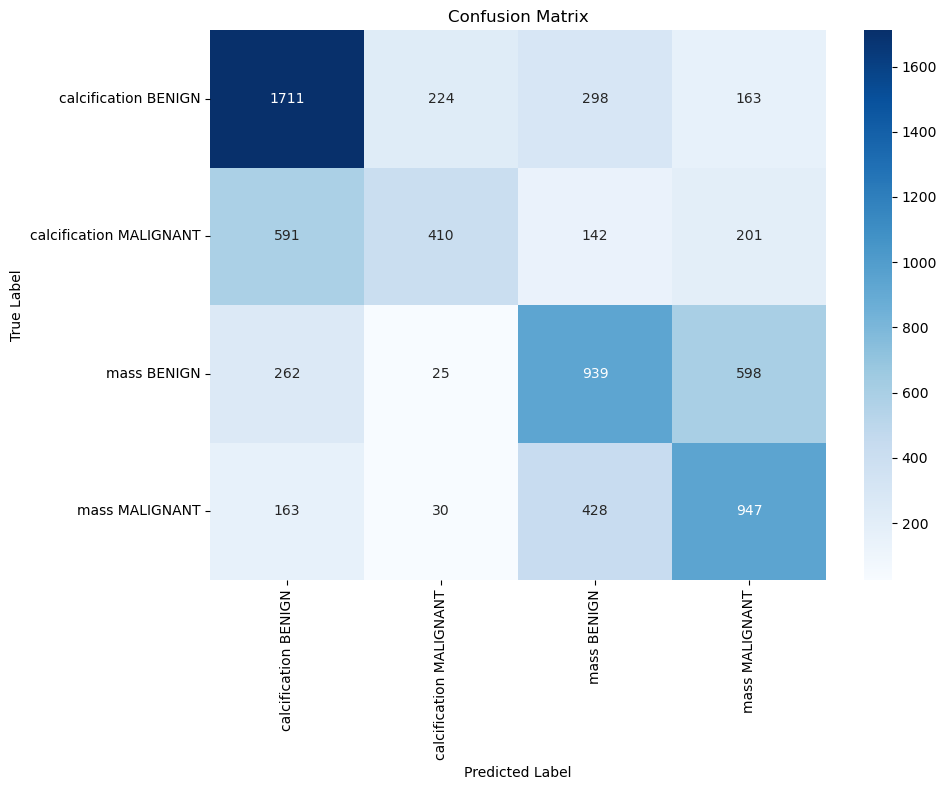

In [69]:
final_table, cm = evaluate_model(models, train_images, train_labels, class_names)
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

#### Testing dataset results

38/38 ━━━━━━━━━━━━━━━━━━━━ 17s 457ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 24s 642ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 24s 641ms/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,62.8%,56.5%,51.1%,46.3%,54.2%
recall,70.5%,31.8%,47.5%,58.7%,52.1%
f1-score,66.4%,40.7%,49.2%,51.8%,52.0%


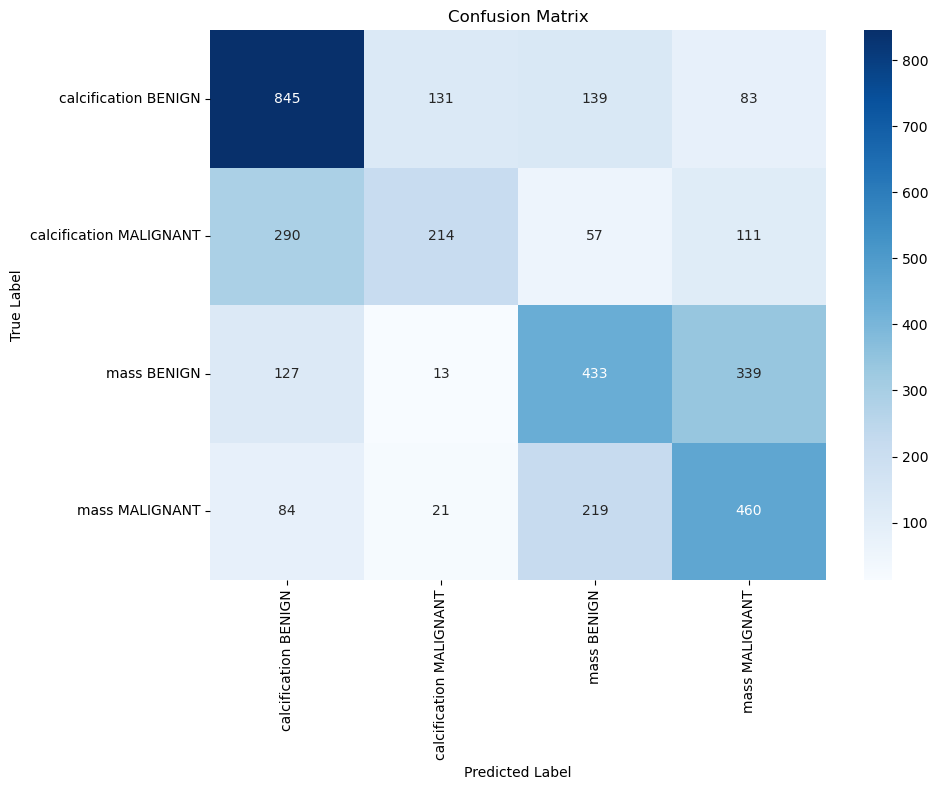

In [89]:
final_table, cm = evaluate_model(models, test_images, test_labels, class_names)
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

In [ ]:
del models, test_images, test_labels, fold_indices, train_images, train_labels

#### 5.5.3 Model 3

We now import the InceptionV3 model with weights obtained by training on the ImageNet dataset. To this model we add two dense layers that use the features obtained by InceptionV3 to determine which categories the inputted images belong to. We also add L1 and L2 regularisation in an attempt to combat overfitting. 

In [55]:
def create_model_3(initial_learning_rate):
    
    #Import the Inception V3 model with weights pre-trained on the ImageNet dataset
    base_model = InceptionV3(weights='imagenet', include_top=False)
    x = base_model.output

    #Code use to freeze a portion of the model during training
    #base_model.trainable = True
    # Optionally, only unfreeze last few layers:
    #for layer in base_model.layers[:-20]:
    #    layer.trainable = False

    #Classification layers
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu', kernel_regularizer=l1_l2(l1=0.001, l2=0.001))(x)
    x = Dropout(0.3)(x)  
    predictions = Dense(4, activation='softmax')(x)

    #Model
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=Adam(learning_rate=initial_learning_rate), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

    return model

We can now use the run_kfold_models_aug and the evaluation functions to obtain the results for this iteration.

In [61]:
#models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models_aug(
#    dataset_images, dataset_labels,
#    num_classes=num_classes,
#    model_fn=create_model_3,
#    model_dir='kfold_results/model_3.2',
#    mode='train',
#    max_epochs=100
#)

models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models_aug(
    dataset_images, dataset_labels,
    num_classes=num_classes,
    model_fn=create_model_3,  
    model_dir='kfold_results/model_3.2', 
    mode='load'
)

Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 574s 6s/step - accuracy: 0.3988 - loss: 46.7367 - val_accuracy: 0.4533 - val_loss: 39.9736 - learning_rate: 1.0000e-04
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 425s 6s/step - accuracy: 0.5926 - loss: 37.6761 - val_accuracy: 0.5963 - val_loss: 31.6635 - learning_rate: 1.0000e-04
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 427s 6s/step - accuracy: 0.6528 - loss: 29.6988 - val_accuracy: 0.5627 - val_loss: 24.7100 - learning_rate: 1.0000e-04
Epoch 4/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 422s 6s/step - accuracy: 0.6872 - loss: 22.8021 - val_accuracy: 0.6316 - val_loss: 18.4607 - learning_rate: 1.0000e-04
Epoch 5/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 426s 6s/step - accuracy: 0.6968 - loss: 16.9730 - val_accuracy: 0.6417 - val_loss: 13.5072 - learning_rate: 1.0000e-04
Epoch 6/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 404s 5s/step - accuracy: 0.7216 - loss: 12.2750 - val_accuracy: 0.6325 - val_loss: 9.7728 - learning_rate: 1.0000e-04
Epoch 7/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 401s 5s/step -

Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 533s 6s/step - accuracy: 0.3880 - loss: 46.7776 - val_accuracy: 0.5080 - val_loss: 39.8407 - learning_rate: 1.0000e-04
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 429s 6s/step - accuracy: 0.5744 - loss: 37.5334 - val_accuracy: 0.5837 - val_loss: 31.3144 - learning_rate: 1.0000e-04
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 429s 6s/step - accuracy: 0.6514 - loss: 29.3042 - val_accuracy: 0.6384 - val_loss: 23.9278 - learning_rate: 1.0000e-04
Epoch 4/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 433s 6s/step - accuracy: 0.6802 - loss: 22.1812 - val_accuracy: 0.6140 - val_loss: 17.7577 - learning_rate: 1.0000e-04
Epoch 5/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 435s 6s/step - accuracy: 0.6903 - loss: 16.2601 - val_accuracy: 0.6266 - val_loss: 12.7404 - learning_rate: 1.0000e-04
Epoch 6/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 435s 6s/step - accuracy: 0.6930 - loss: 11.5210 - val_accuracy: 0.6594 - val_loss: 8.9179 - learning_rate: 1.0000e-04
Epoch 7/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 432s 6s/step -

Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 531s 6s/step - accuracy: 0.3897 - loss: 46.9305 - val_accuracy: 0.5093 - val_loss: 40.1419 - learning_rate: 1.0000e-04
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 458s 6s/step - accuracy: 0.5673 - loss: 37.9568 - val_accuracy: 0.5657 - val_loss: 32.0042 - learning_rate: 1.0000e-04
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 463s 6s/step - accuracy: 0.6219 - loss: 30.0301 - val_accuracy: 0.6263 - val_loss: 24.8815 - learning_rate: 1.0000e-04
Epoch 4/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 447s 6s/step - accuracy: 0.6454 - loss: 23.2063 - val_accuracy: 0.6162 - val_loss: 18.8927 - learning_rate: 1.0000e-04
Epoch 5/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 443s 6s/step - accuracy: 0.6723 - loss: 17.4474 - val_accuracy: 0.6338 - val_loss: 13.9189 - learning_rate: 1.0000e-04
Epoch 6/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 447s 6s/step - accuracy: 0.7168 - loss: 12.7265 - val_accuracy: 0.6700 - val_loss: 9.9990 - learning_rate: 1.0000e-04
Epoch 7/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 432s 6s/step -

#### Training dataset results

75/75 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,97.0%,99.2%,99.4%,97.7%,98.3%
recall,99.8%,95.9%,97.1%,98.8%,97.9%
f1-score,98.4%,97.5%,98.3%,98.2%,98.1%


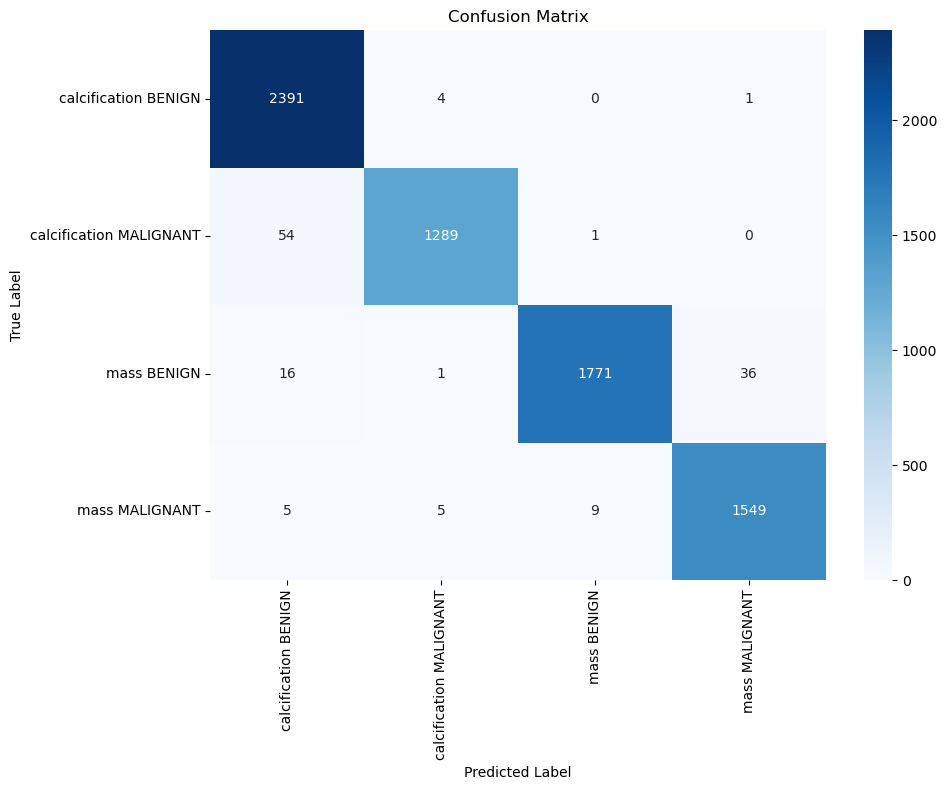

In [63]:
final_table, cm = evaluate_model(models, train_images, train_labels, class_names)
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

#### Testing dataset results

38/38 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,67.7%,58.3%,70.8%,62.5%,64.8%
recall,81.8%,43.0%,64.0%,63.6%,63.1%
f1-score,74.1%,49.5%,67.2%,63.1%,63.5%


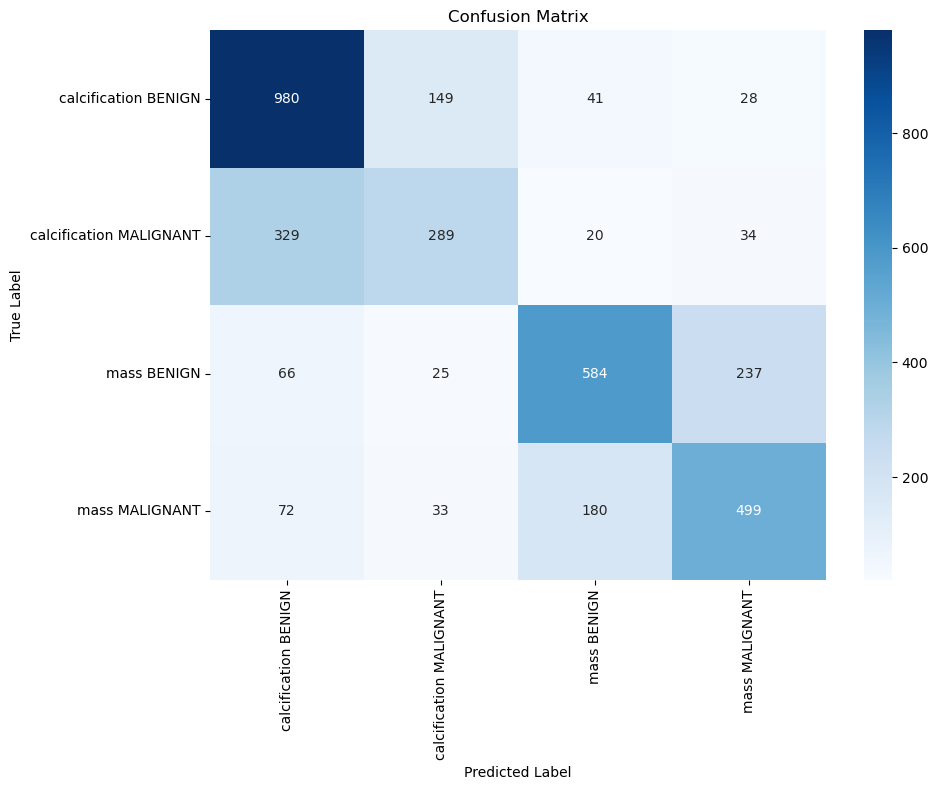

In [64]:
final_table, cm = evaluate_model(models, test_images, test_labels, class_names)
final_table.to_pickle("metrics_table.pkl")
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

In [ ]:
del models, test_images, test_labels, fold_indices, train_images, train_labels

#### 5.5.4 Model 4

We now import the EfficientNetB3 model with weights obtained by training on the ImageNet dataset. To this model we add two dense layers that use the features obtained by EfficientNetB3 to determine which categories the inputted images belong to. We also add L1 and L2 regularisation in an attempt to combat overfitting. 

In [73]:
def create_model_4(initial_learning_rate):
    
    # Import the EfficientNetB3 model with weights pre-trained on the ImageNet dataset
    base_model = EfficientNetB1(weights='imagenet', include_top=False)
    x = base_model.output

    # Classification layers
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu', kernel_regularizer=l1_l2(l1=0.001, l2=0.001))(x)
    x = Dropout(0.3)(x)  
    predictions = Dense(4, activation='softmax')(x)

    # Model
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=Adam(learning_rate=initial_learning_rate), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

    return model

In [79]:
#models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models_aug(
#    dataset_images, dataset_labels,
#    num_classes=num_classes,
#    model_fn=create_model_4,
#    model_dir='kfold_results/model_4.1',
#    mode='train',
#    max_epochs=100
#)

models, test_images, test_labels, fold_indices, train_images, train_labels = run_kfold_models_aug(
    dataset_images, dataset_labels,
    num_classes=num_classes,
    model_fn=create_model_4,  
    model_dir='kfold_results/model_4.1', # Still needed to pass even in 'load'
    mode='load'
)

#### Training dataset results

75/75 ━━━━━━━━━━━━━━━━━━━━ 63s 734ms/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,92.5%,84.4%,91.8%,84.6%,88.3%
recall,93.0%,90.0%,79.6%,91.3%,88.5%
f1-score,92.7%,87.1%,85.3%,87.9%,88.2%


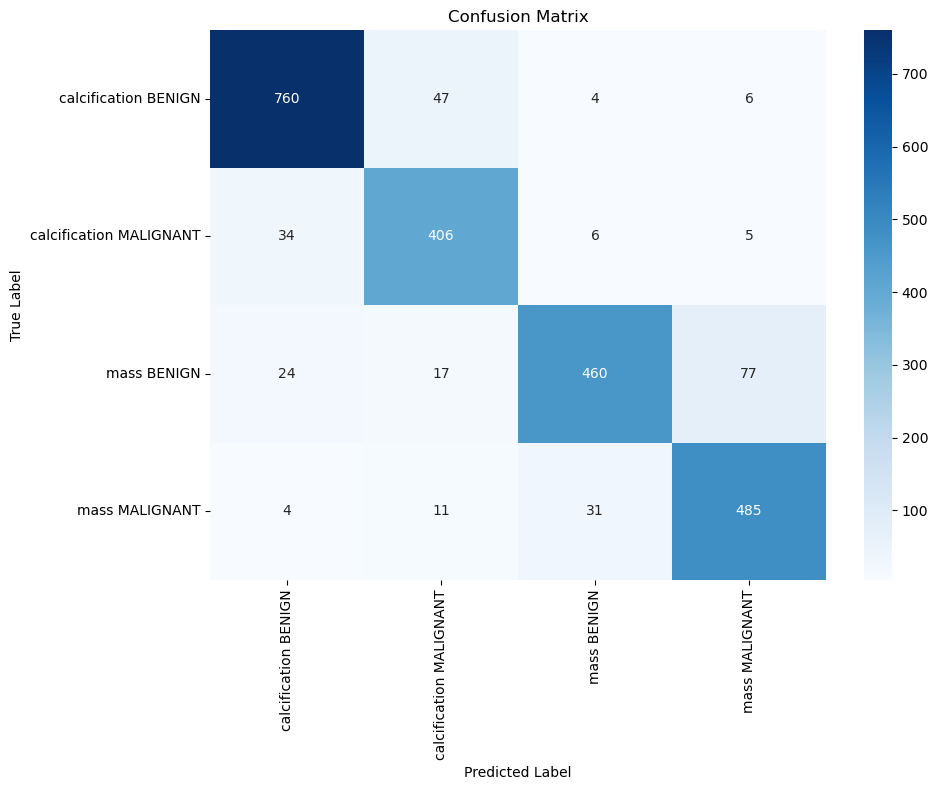

In [81]:
final_table, cm = evaluate_model([models[0]], [train_images[0]], [train_labels[0]], class_names)
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

#### Testing dataset results

38/38 ━━━━━━━━━━━━━━━━━━━━ 27s 714ms/step
F1, Precision, Recall Table with Macro Average:


,calcification BENIGN,calcification MALIGNANT,mass BENIGN,mass MALIGNANT,Total (Macro Avg)
precision,67.5%,52.4%,76.6%,62.2%,64.7%
recall,75.9%,53.4%,61.7%,65.6%,64.1%
f1-score,71.4%,52.9%,68.3%,63.8%,64.1%


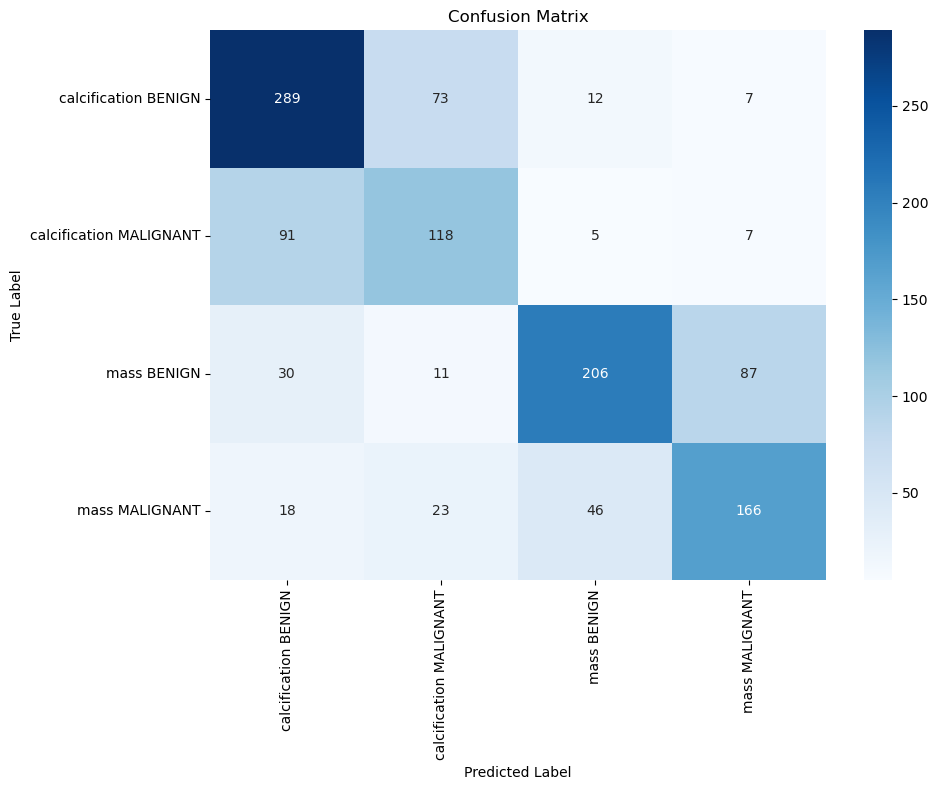

In [83]:
final_table, cm = evaluate_model([models[0]], [test_images[0]], [test_labels[0]], class_names)
final_table.to_pickle("metrics_table.pkl")
print("F1, Precision, Recall Table with Macro Average:")
display(final_table)
plot_confusion_matrix(cm, class_names=class_names)

In [ ]:
del models, test_images, test_labels, fold_indices, train_images, train_labels

Lastly, we will show the original cropped image, GradCam generated image, and ROI image to see how well the generated heatmap corresponds to the ROI region. This will give us an idea of how good GradCam is at identifying the parts of the image that should influence its prediction. We will also save the original and ROI images in order to use them in the final app. 

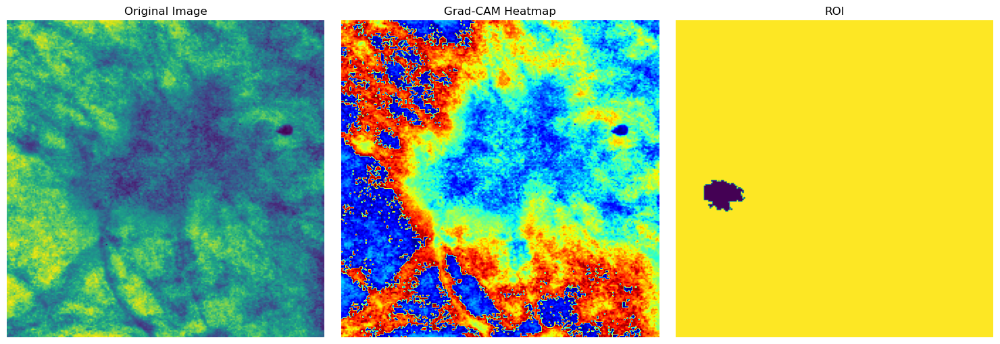

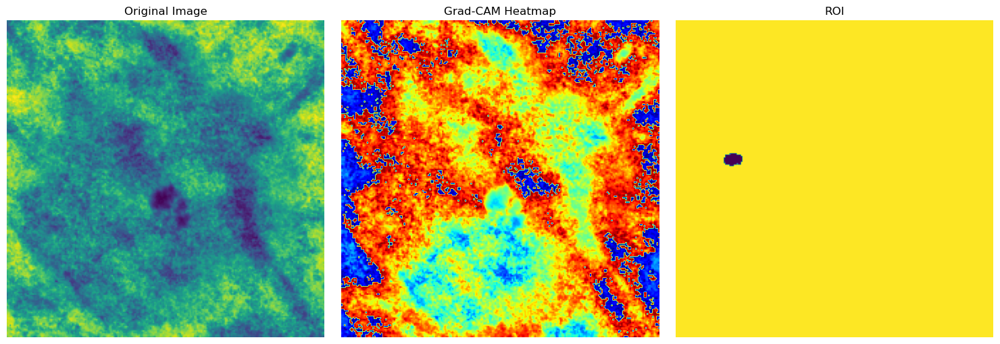

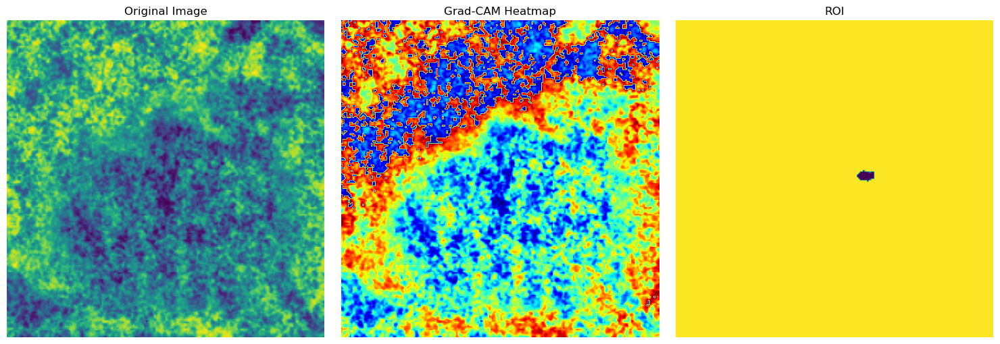

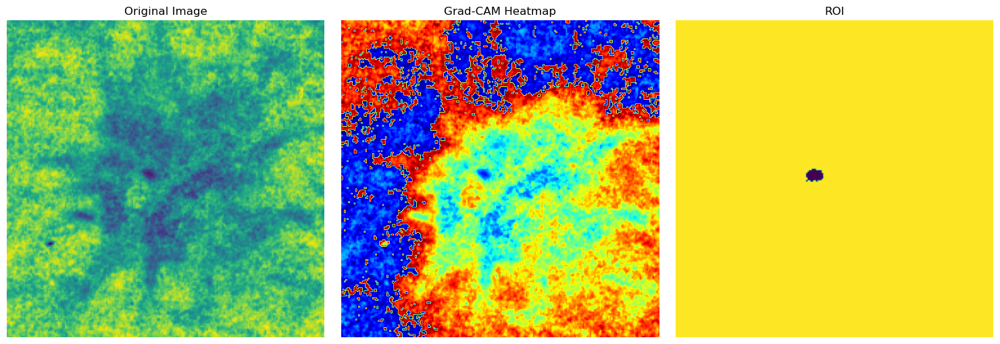

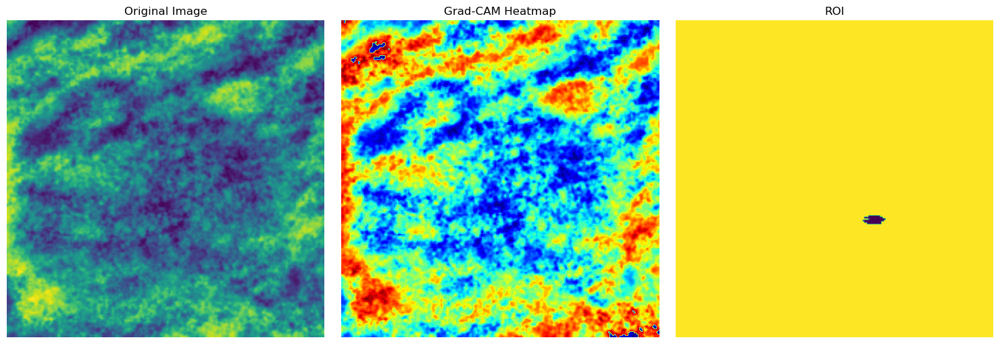

...

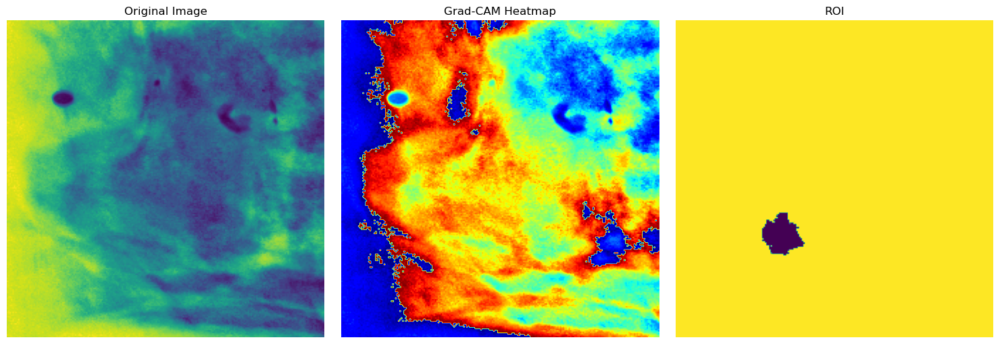

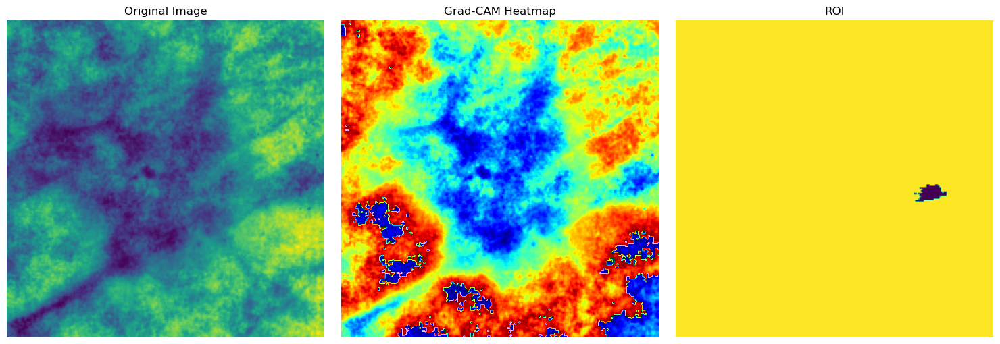

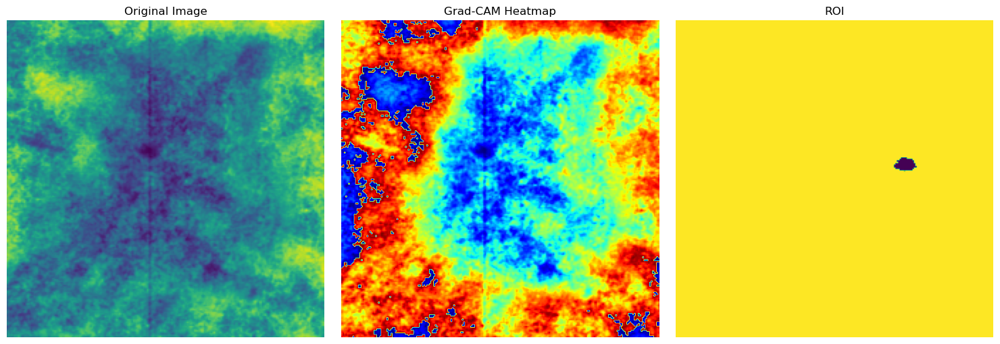

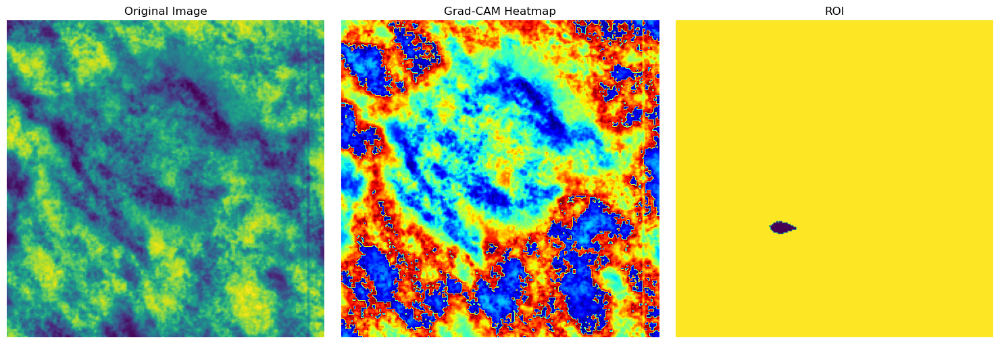

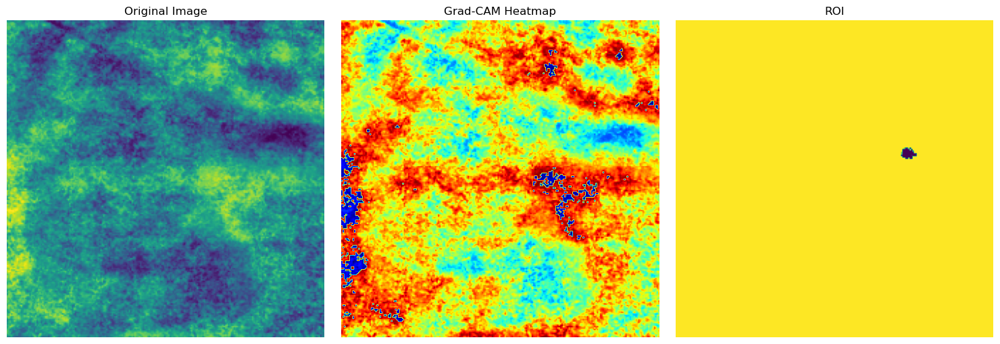

In [124]:
#Create the folder for the cropped and ROI example images. 
output_folder = 'fixed_samples'
os.makedirs(output_folder, exist_ok=True)

#Display 15 cases
for i in range(15):
    fold, index = 0, i

    #Get the cropped and ROI image paths. Fold-indices is used to get the image index in combined_df for a certain fold and index within the fold
    index_calc = fold_indices[fold][index]
    ROI_path = combined_df.loc[index_calc, 'ROI mask file path']
    image_path = combined_df.loc[index_calc, 'cropped image file path']

    #Obtain the ROI and cropped image
    ROI_img = process_image(ROI_path, (224, 224, 3))
    test_image = test_images[fold][index]  

    # Define the path under which the ROI and cropped image will be saved and save them
    dest_image_path = os.path.join(output_folder, "index"+str(index)+"_image.png")
    dest_roi_path = os.path.join(output_folder, "index"+str(index)+"__ROI.png")
    shutil.copy2(image_path, dest_image_path)
    shutil.copy2(ROI_path, dest_roi_path)

    #Use GradCam to generate the heatmap for the corresponding image and plot the cropped, ROI, and GradCam image.
    model = models[0]  
    show_gradcam(test_image, model, ROI_img)